In [123]:

import sys
import numpy as np
import matplotlib.pyplot as plt
import h5py as h5
import time
import os
import copy
import timeit
print os.getcwd()
os.chdir('/reg/neh/home/marcgri/Software/skopi/examples')
import skopi as sk
import skopi.gpu as sg
import random


/reg/neh/home5/marcgri/Software/skopi


In [ ]:

# Load beam
beam = sk.Beam('../input/exp_chuck.beam') 

# Load and initialize the detector
det = sk.PnccdDetector(geom = '../../lcls/amo86615/PNCCD::CalibV1/Camp.0:pnCCD.1/geometry/0-end.data', 
                       beam = beam)




#Detector distance to particle was decreased from 0.15 m to 0.581 m for higher resolution of the patterns.

# Method 1: add the PDBs together as patterns

In [41]:
mesh_length = 201
pattern_shape = det.pedestal.shape
pixel_num = np.prod(pattern_shape)
pixel_momentum = det.pixel_position_reciprocal
mesh, voxel_length = det.get_reciprocal_mesh(voxel_number_1d = mesh_length)


This method takes in a PDB file and changes the coordinates of the molecule or protein. Each time after one of these translations/rotations occurs, a diffraction pattern is captured for the intensity. The patterns are then summed up into a combined pattern. A chaperone was used as the particle in the simulated image.

# Method 1: Make one pattern

As a start, one intensity diffraction pattern is created using no translations or rotations to establish a base case. Three planar views of the diffraction volume are shown below along with an Ewald slice through the volume.

In [5]:
particle = sk.Particle()
particle.read_pdb('../input/3iyf.pdb')
i1 = sg.calculate_diffraction_pattern_gpu(mesh,particle,return_type='intensity')


orientation = sk.geometry.get_uniform_quat(num_pts=mesh_length)
hundred_slices = sk.geometry.take_n_slice(pattern_shape = pattern_shape,
                                       pixel_momentum = pixel_momentum,
                                       volume =i1,
                                       voxel_length= voxel_length,
                                       orientations= orientation)



Deprecation warning: The typo was corrected. Please use 'take_n_slices' instead. Note, however, than the signature is different!


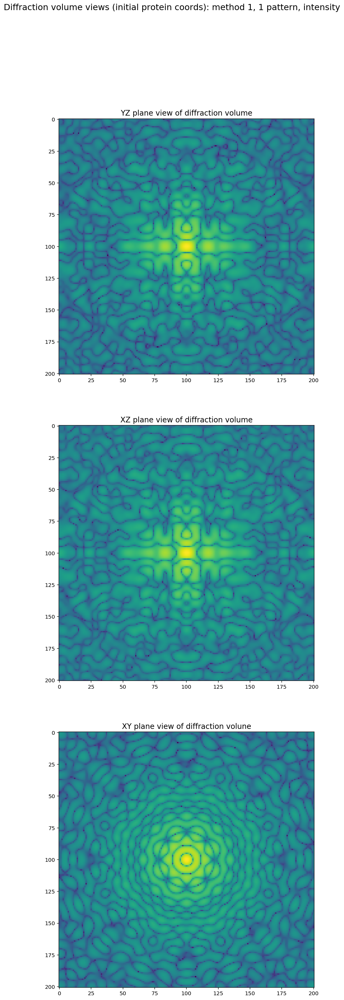

In [97]:

fig = plt.figure(figsize=(30,30))
fig.suptitle("Diffraction volume views (initial protein coords): (method 1, 1 pattern, intensity)",fontsize=16)
ax1 = plt.subplot(3,1,1)
ax1.set_title("YZ plane view of diffraction volume",fontsize=14)
plt.imshow(np.log10(i1[mesh_length/2,:,:]+1))
ax2 = plt.subplot(3,1,2)
ax2.set_title("XZ plane view of diffraction volume",fontsize=14)
plt.imshow(np.log10(i1[:,mesh_length/2,:]+1))
ax3 = plt.subplot(3,1,3)
ax3.set_title("XY plane view of diffraction volume",fontsize=14)
plt.imshow(np.log10(i1[:,:,mesh_length/2]+1))
plt.show()
#plt.colorbar()

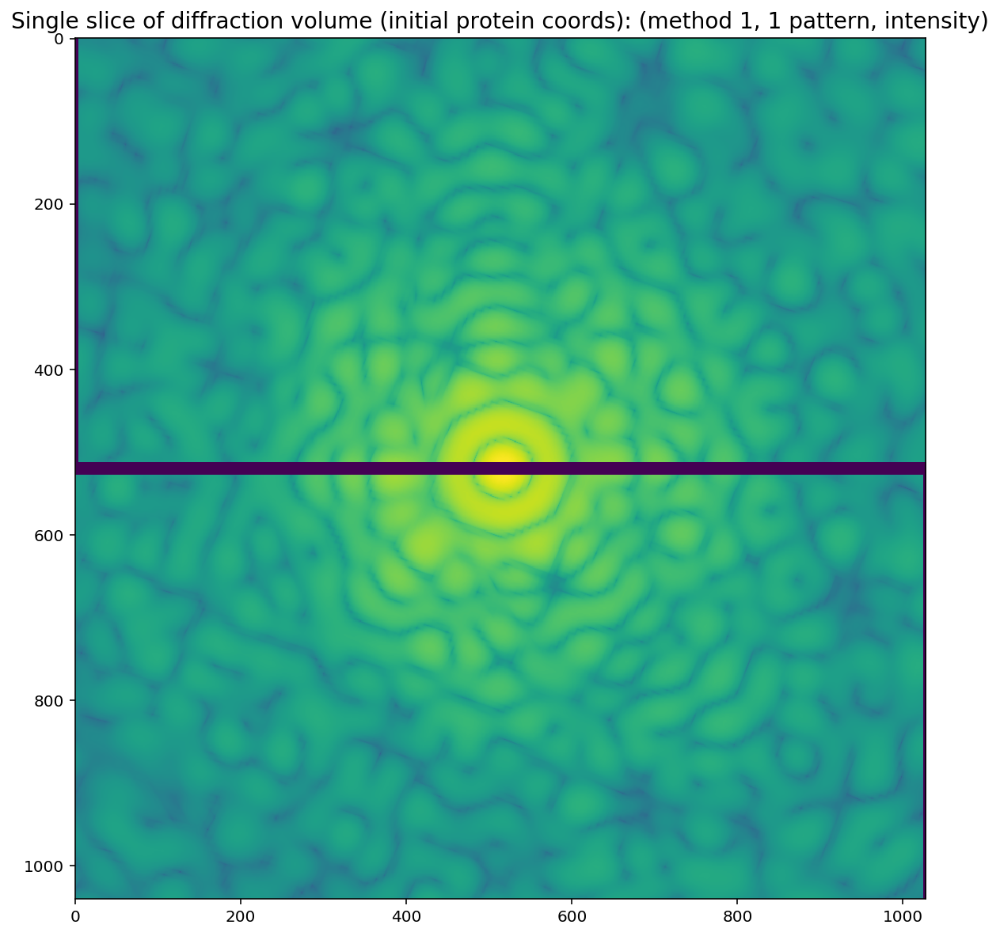

In [94]:

hs = det.assemble_image_stack_batch(image_stack_batch=hundred_slices)

plt.figure(figsize=(10,10))

plt.imshow(np.log10(hs[0,:,:]+1))
plt.title('Single slice of diffraction volume (initial protein coords): (method 1, 1 pattern, intensity)', fontsize=14)

plt.show()


Now we rotate the particle randomly one time and calculate the diffraction volume, which is different than the initial setup. We plot the different plane views of the diffraction volume and also an Ewald slice through that  volume.

In [12]:
particle.rotate_randomly()
i2 = sg.calculate_diffraction_pattern_gpu(mesh,particle,return_type='intensity')


orientation2 = sk.geometry.get_uniform_quat(num_pts=mesh_length)
hundred_slices2 = sk.geometry.take_n_slice(pattern_shape = pattern_shape,
                                       pixel_momentum = pixel_momentum,
                                       volume =i2,
                                       voxel_length= voxel_length,
                                       orientations= orientation2)

Deprecation warning: The typo was corrected. Please use 'take_n_slices' instead. Note, however, than the signature is different!


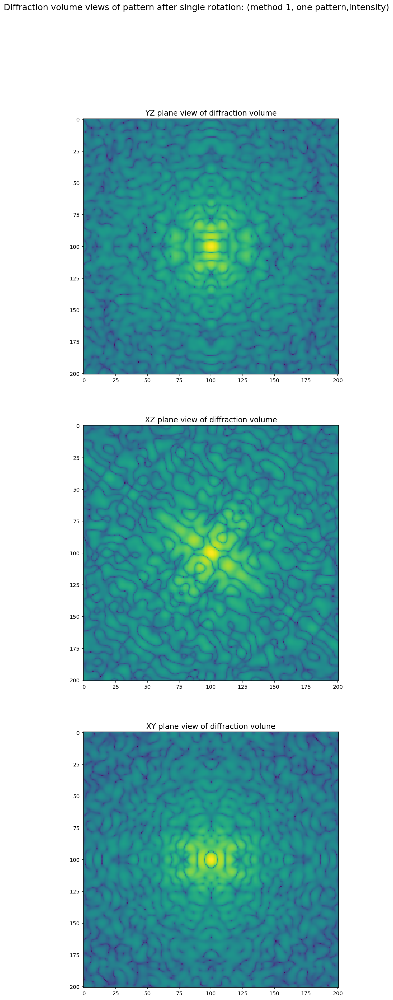

In [93]:

fig = plt.figure(figsize=(30,30))
fig.suptitle("Diffraction volume views of pattern after single rotation: (method 1, one pattern,intensity)", fontsize=16)
ax1 = plt.subplot(3,1,1)
ax1.set_title("YZ plane view of diffraction volume",fontsize=14)

plt.imshow(np.log10(i2[mesh_length/2,:,:]))
ax2 = plt.subplot(3,1,2)
ax2.set_title("XZ plane view of diffraction volume",fontsize=14)

plt.imshow(np.log10(i2[:,mesh_length/2,:]))
ax3 = plt.subplot(3,1,3)
ax3.set_title("XY plane view of diffraction volume",fontsize=14)

plt.imshow(np.log10(i2[:,:,mesh_length/2]))
plt.show()
#plt.colorbar()

(201, 1040, 1028)


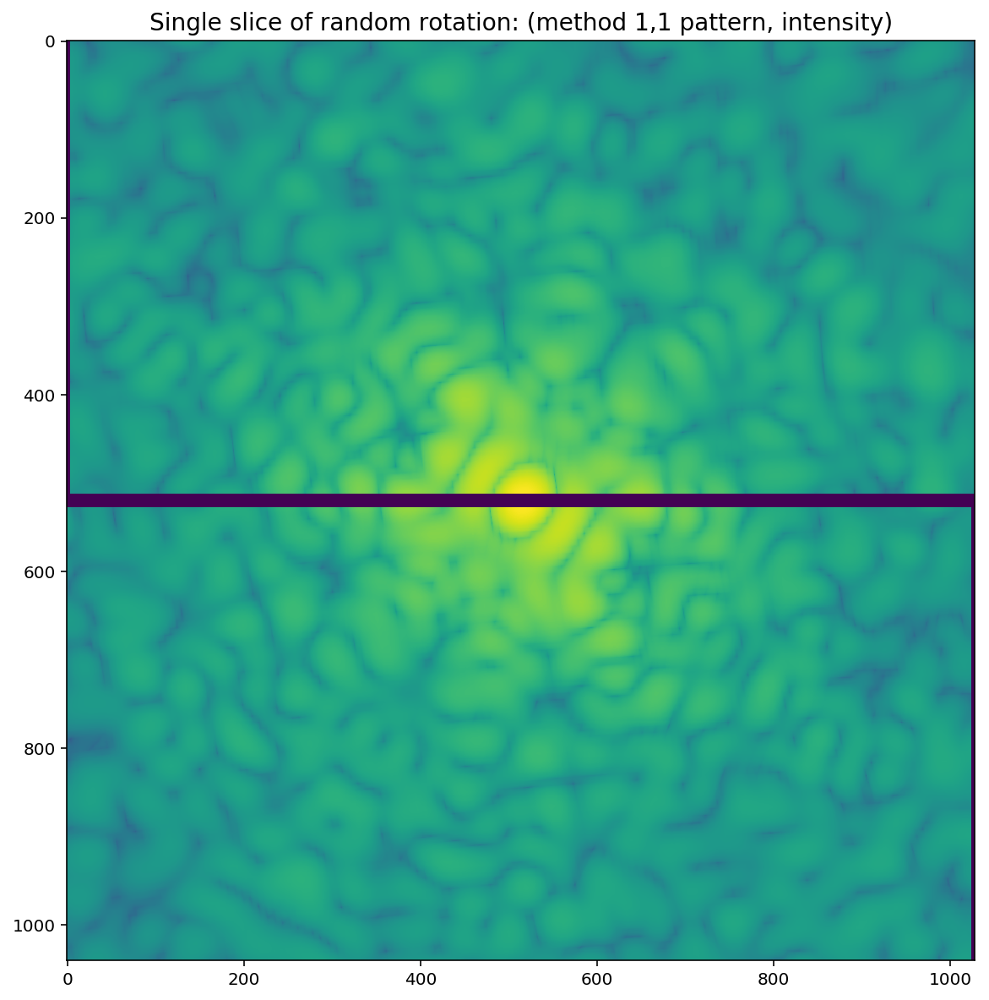

In [119]:

hs2 = det.assemble_image_stack_batch(image_stack_batch=hundred_slices2)
plt.figure(figsize=(10,10))
plt.title('Single slice of random rotation: (method 1,1 pattern, intensity)',fontsize=14)

plt.imshow(np.log10(hs2[mesh_length/2,:,:]+1))

plt.show()


Now the particle is translated a single time from the initial coordinates of the particle, independent of the last rotation. The same plots of the diffraction volume and a slice through that volume are shown below.

In [15]:
   trans_max = 1e-9
    
   beam_size = beam.get_focus()
   dx = trans_max*np.random.uniform(-1,1)
   dy = trans_max*np.random.uniform(-1,1)
   dz = 0
   while(np.sqrt(dx**2 + dy**2) > beam_size):
    
       dx = trans_max*np.random.uniform(-1,1)
       dy = trans_max*np.random.uniform(-1,1)
       dz = 0
    


   translation = np.array([dx,dy,dz])
   
   n = [[dx,dy,dz]]*particle.get_num_atoms()
   delta  = np.asarray(n)
   
   atom_pos = particle.get_atom_pos()


   new_pos = atom_pos + delta
   particle.set_atom_pos(new_pos)
   
   pattern_trans = sg.calculate_diffraction_pattern_gpu(mesh,particle, return_type='intensity')


orientation_trans = sk.geometry.get_uniform_quat(num_pts=101)
more_slices_trans = sk.geometry.take_n_slice(pattern_shape = pattern_shape,
                                      pixel_momentum = pixel_momentum,
                                      volume =pattern_trans,
                                      voxel_length= voxel_length,
                                      orientations= orientation_trans)

Deprecation warning: The typo was corrected. Please use 'take_n_slices' instead. Note, however, than the signature is different!


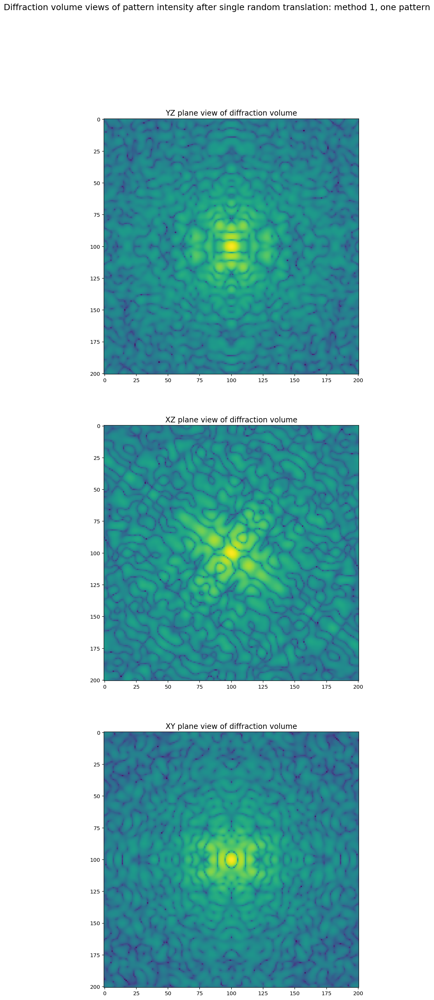

In [65]:

fig = plt.figure(figsize=(30,30))
fig.suptitle("Diffraction volume views of pattern intensity after single random translation: method 1, one pattern", fontsize=16)

ax1 = plt.subplot(3,1,1)
ax1.set_title("YZ plane view of diffraction volume",fontsize=14)

plt.imshow(np.log10(pattern_trans[mesh_length/2,:,:]))
ax2 = plt.subplot(3,1,2)
ax2.set_title("XZ plane view of diffraction volume",fontsize=14)

plt.imshow(np.log10(pattern_trans[:,mesh_length/2,:]))
ax3 = plt.subplot(3,1,3)
ax3.set_title("XY plane view of diffraction volume",fontsize=14)

plt.imshow(np.log10(pattern_trans[:,:,mesh_length/2]))
plt.show()
#plt.colorbar()

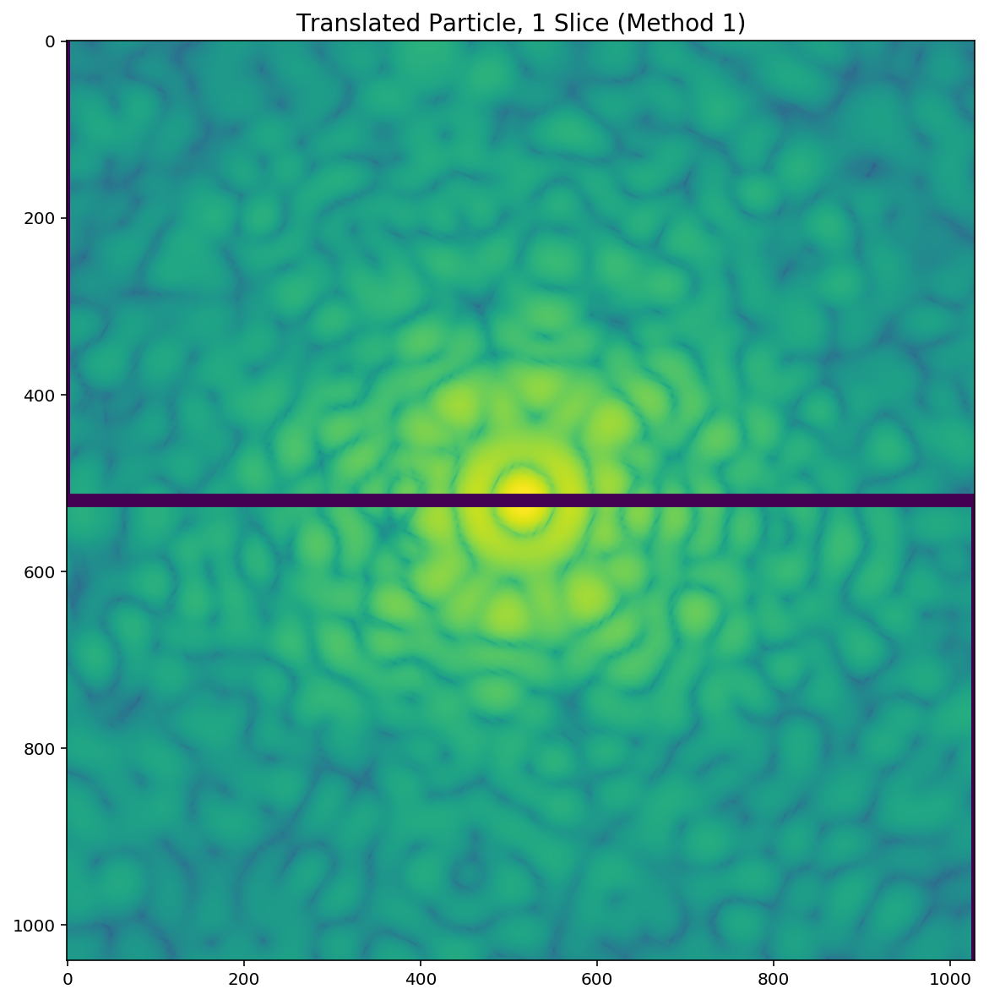

In [63]:
# ph1 = det.add_correction_and_quantization_batch(pattern_batch=hundred_slices)

hs_trans = det.assemble_image_stack_batch(image_stack_batch=more_slices_trans)
#ph1 = det.add_correction_and_quantization(pattern=hs)
plt.figure(figsize=(10,10))

plt.imshow(np.log10(hs_trans[0,:,:]+1))
plt.title('Translated Particle, 1 Slice (Method 1)',fontsize=14)
plt.show()

# Method 1, make sum of many patterns

This section simulates the combined sum of many patterns, each from one independent translation and one rotation per pattern. 

In [18]:

start = time.time()

particle1 = sk.Particle()
particle1.read_pdb('examples/input/3iyf.pdb') # chaperone

# number of translation/rotation patterns
# random seed for consistency with method 2
number = 100
random.seed(30)


# create first pattern with initial coordinates of protein
pattern1 = sg.calculate_diffraction_pattern_gpu(det.pixel_position_reciprocal,particle1,return_type='complex_field') 
orientation = sk.geometry.get_random_quat(num_pts=number)


p = pattern1

# max translation value
# x,y transltion has to be less that the beam radius
trans_max = 1e-9


# calculate many patterns with different rotations/translations and sum the patterns
for i in range(number):
    
   particle2 = copy.deepcopy(particle1)
   particle2.rotate(orientation[i,:])
   
   beam_size = beam.get_focus()
   dx = trans_max*np.random.uniform(-1,1)
   dy = trans_max*np.random.uniform(-1,1)
   dz = 0
   while(np.sqrt(dx**2 + dy**2) > beam_size):
    
       dx = trans_max*np.random.uniform(-1,1)
       dy = trans_max*np.random.uniform(-1,1)
       dz = 0
    


   translation = np.array([dx,dy,dz])
   
   n = [[dx,dy,dz]]*particle2.get_num_atoms()
   delta  = np.asarray(n)
   
   atom_pos = particle2.get_atom_pos()


   new_pos = atom_pos + delta
   particle2.set_atom_pos(new_pos)
   
   # n`
   pattern = sg.calculate_diffraction_pattern_gpu(det.pixel_position_reciprocal,particle2, return_type='complex_field')

   p += pattern
   
   print i

intens = np.abs(p) ** 2

end = time.time()
print 'Processed %d images in %f seconds' % (i+1,end-start)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Processed 100 images in 840.482581 seconds


In [20]:
photons = det.add_correction_and_quantization(pattern=intens)

pp = det.assemble_image_stack(image_stack=photons)
#print pp.shape

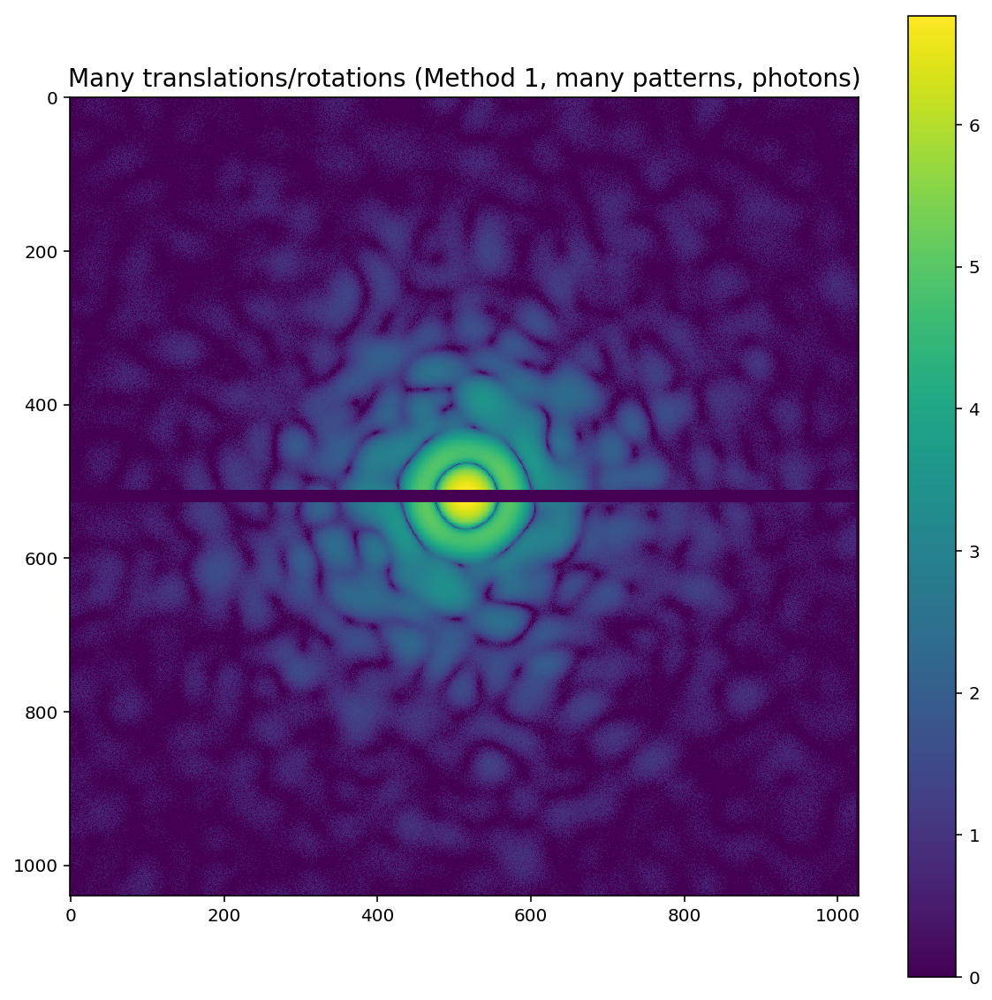

In [91]:

plt.figure(figsize=(10,10))
plt.title('Many translations/rotations (Method 1, many patterns, photons)',fontsize=14)
plt.imshow(np.log10(pp+1))
plt.colorbar()
plt.show()

# Method 2: Apply phase offset for translations

The second method uses a single independent rotation and translation per pattern. The patterns are summed up as in method 1. The difference is that we apply a phase shift in reciprocal space  for a translation in real space. This example does not show the single pattern case as in method 1.

In [22]:

mesh_length=201
pattern_shape = det.pedestal.shape
pixel_momentum= det.pixel_position_reciprocal


orientation = sk.geometry.get_uniform_quat(mesh_length)



mesh,voxel_length = det.get_reciprocal_mesh(voxel_number_1d = mesh_length)



diffVol1 = sg.calculate_diffraction_pattern_gpu(mesh,particle1, return_type='complex_field')




intensSlice = sk.geometry.take_n_slice(pattern_shape=pattern_shape,
                                        pixel_momentum=pixel_momentum,
                                        volume=diffVol1,
                                        voxel_length=voxel_length,
                                        orientations=orientation) 

Deprecation warning: The typo was corrected. Please use 'take_n_slices' instead. Note, however, than the signature is different!


skopi/geometry/slice_.py:121: ComplexWarning: Casting complex values to real discards the imaginary part
  orientations[l], inverse)


In [23]:
random.seed(30)

pattern_shape = det.pedestal.shape
pixel_momentum= det.pixel_position_reciprocal

number = 100
orientation = sk.geometry.get_random_quat(number)

mesh_length = 201
V = 201
trans_max = 1e-9


mesh,voxel_length = det.get_reciprocal_mesh(voxel_number_1d = mesh_length)

start = time.time()
# 
diffVol1 = sg.calculate_diffraction_pattern_gpu(mesh,particle1, return_type='complex_field')
diffV = diffVol1

hh = np.arange(-V/2,V/2)
h,k,l = np.meshgrid(hh,hh,hh)
onesMatrix = np.ones((V,V,V),dtype=np.int32)

for i in range(number):
     
   particle2 = copy.deepcopy(particle1)
   particle2.rotate(orientation[i,:])
   beam_size = beam.get_focus()

   dx = trans_max*np.random.uniform(-1,1)
   dy = trans_max*np.random.uniform(-1,1)
   dz = 0
   while(np.sqrt(dx**2 + dy**2) > beam_size):
    
       dx = trans_max*np.random.uniform(-1,1)
       dy = trans_max*np.random.uniform(-1,1)
       dz = 0
    


   diffVolumeRot   = sg.calculate_diffraction_pattern_gpu(mesh,particle2, return_type='complex_field')
 
 
   big_dx = onesMatrix*dx
   big_dy = onesMatrix*dy
   big_dz = onesMatrix*dz
   
   translation = np.array([dx,dy,dz])
   
   diffVol2 = diffVolumeRot*np.exp(-1j*2*np.pi*(h*big_dx + k*big_dy + l*big_dz )/V)
   diffV += diffVol2
   print i

intensVol = np.abs(diffV)**2


intensSlice = sk.geometry.take_n_slice(pattern_shape=pattern_shape,
                                        pixel_momentum=pixel_momentum,
                                        volume=intensVol,
                                        voxel_length=voxel_length,
                                        orientations=orientation) 
        
    


photons = det.add_correction_and_quantization_batch(pattern_batch=intensSlice)

# Assemble all the image stack
imStack = det.assemble_image_stack_batch(image_stack_batch=photons)
#print imStack.shape
#plt.imshow(imStack[0,:,:],vmin=0,vmax=5)
#plt.show()
end = time.time()

print 'Volume (%d patterns) created in %f seconds.' % (i+1, end-start)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Deprecation warning: The typo was corrected. Please use 'take_n_slices' instead. Note, however, than the signature is different!
Volume (99 patterns) created in 6636.682694 seconds.


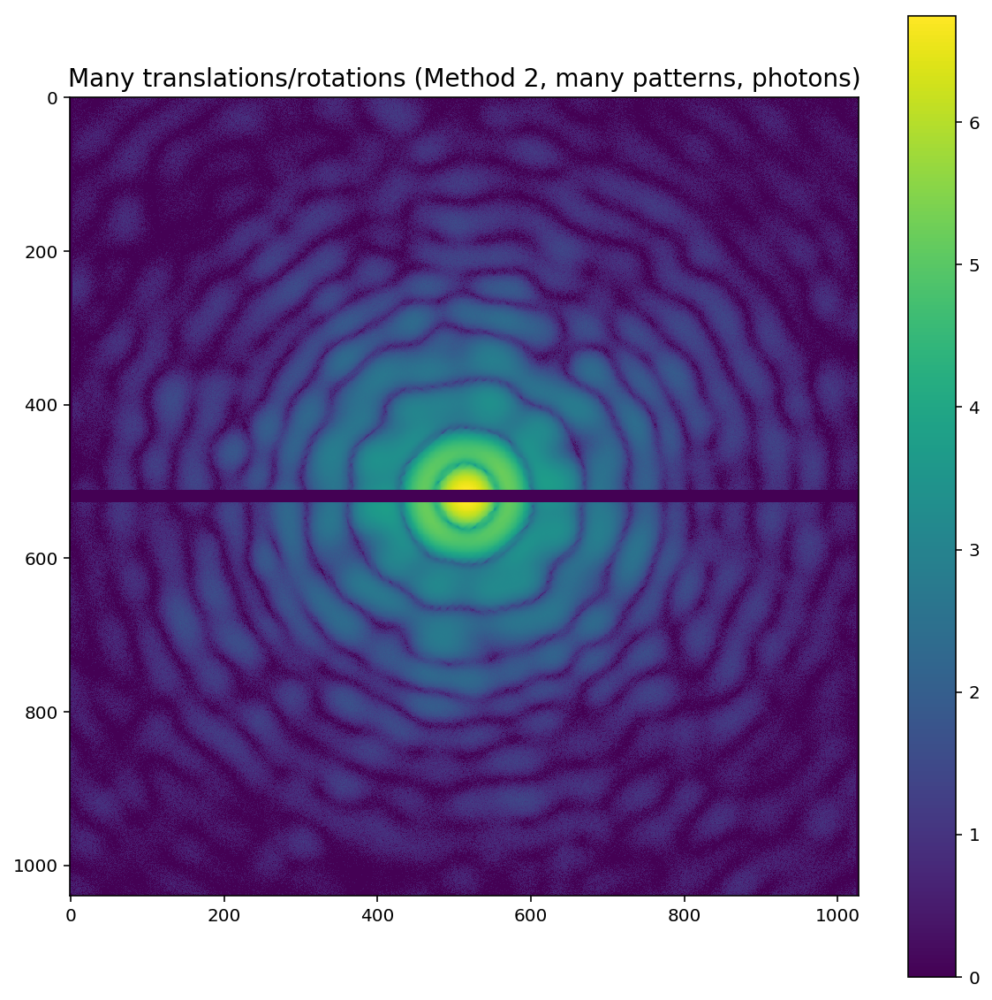

In [92]:
photons = det.add_correction_and_quantization_batch(pattern_batch=intensSlice)
#Assemble all the image stack
imStack = det.assemble_image_stack_batch(image_stack_batch=photons)


im2 = np.log10(imStack[0,:,:]+1)
fig = plt.figure(figsize=(10,10))
plt.title("Many translations/rotations (Method 2, many patterns, photons)",fontsize=14)
plt.imshow(im2)
plt.colorbar()
plt.show()

# Compare the two methods

Now we compared the two methods visually, the comparison of the horizontal and vertical pixel values, and the difference between the two methods in photons.

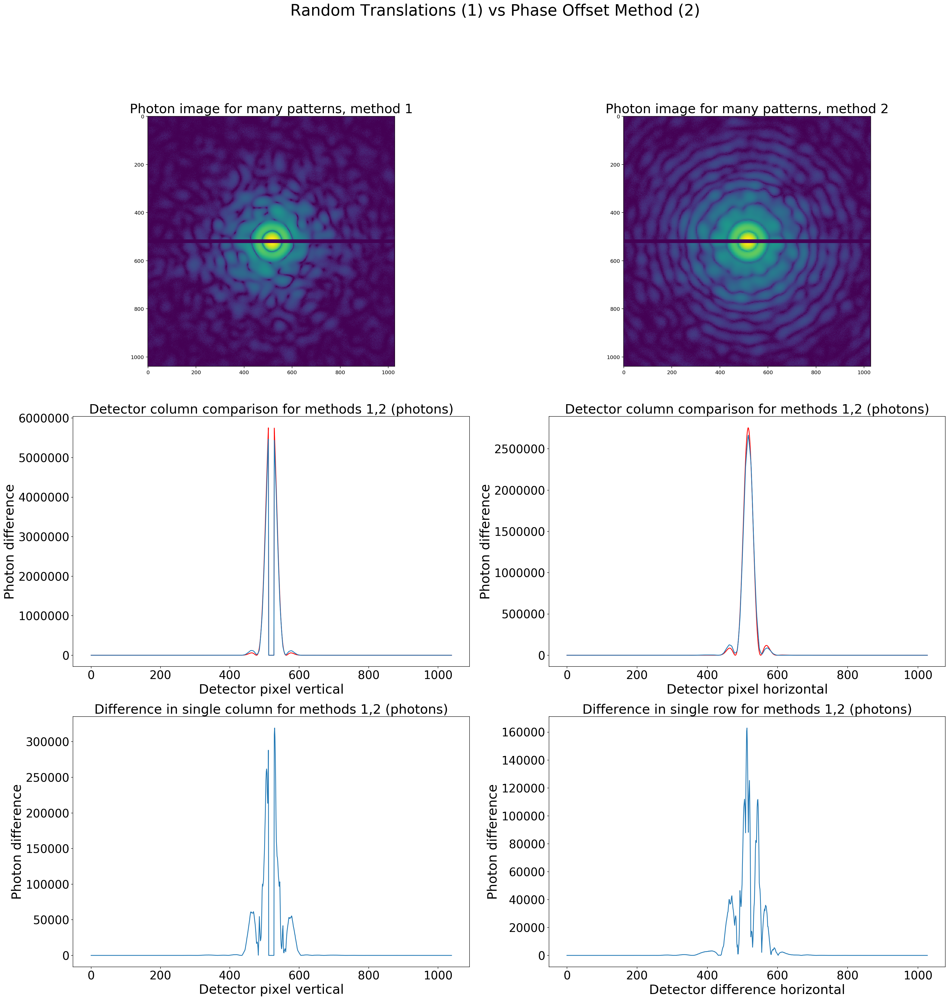

In [125]:
slice = 77
vertical_pixel = 514
horizontal_pixel = 450

fig= plt.figure(figsize=(30,30))
fig.suptitle('Random Translations (1) vs Phase Offset Method (2)',fontsize=30)

im1 = np.log10(pp+1)
ax1 = fig.add_subplot(321)
ax1.set_title('Photon image for many patterns, method 1',fontsize=25)
ax1.imshow(im1)

im2 = np.log10(imStack[slice,:,:]+1)


ax2 = fig.add_subplot(322)
ax2.set_title('Photon image for many patterns, method 2',fontsize=25)
ax2.imshow(im2)

ax3  = fig.add_subplot(323)
ax3.plot(pp[:,514],'r')
ax3.set_title('Detector column comparison for methods 1,2 (photons)',fontsize=25)
ax3.plot(imStack[slice,:,514])
ax3.set_ylabel('Photon difference', fontsize = 25) # Y label
ax3.set_xlabel('Detector pixel vertical', fontsize = 25) # X label
ax3.tick_params(labelsize=22)

ax4 = fig.add_subplot(324)
ax4.set_title('Detector column comparison for methods 1,2 (photons)',fontsize=25)
ax4.plot(pp[500,:],'r')
ax4.plot(imStack[slice,500,:])
ax4.set_ylabel('Photon difference', fontsize = 25) # Y label
ax4.set_xlabel('Detector pixel horizontal', fontsize = 25) # X label
ax4.tick_params(labelsize=22)


ax5 = fig.add_subplot(325)
ax5.set_title('Difference in single column for methods 1,2 (photons)',fontsize=25)
ax5.plot(abs(pp[:,514]-imStack[slice,:,514]))
ax5.set_ylabel('Photon difference', fontsize = 25) # Y label
ax5.set_xlabel('Detector pixel vertical', fontsize = 25) # X label
ax5.tick_params(labelsize=22)

ax6 = fig.add_subplot(326)
ax6.set_title('Difference in single row for methods 1,2 (photons)',fontsize=25)
ax6.plot(abs(pp[500,:]-imStack[slice,500,:]))
ax6.set_ylabel('Photon difference', fontsize = 25)
ax6.set_xlabel('Detector difference horizontal',fontsize=25)
ax6.tick_params(labelsize=22)
